In [ ]:
import pandas as pd
import folium

geo_url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f"{geo_url}/us-states.json"
housing_url = 'https://raw.githubusercontent.com/iantonios/dsc205/refs/heads/main/kc_house_data.csv'


seattle_housing = pd.read_csv(housing_url)
seattle_housing.head()



,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
q1 = seattle_housing.groupby('price')
seattle_housing.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21611.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.396095,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.128162,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [ ]:
for house in seattle_housing.itertuples(): # Iterate over dataframe rows as namedtuples
    if seattle_housing['price'][house.Index] > seattle_housing['price'].quantile(0.75): # Access row's price using Index from namedtuple
        # Append the row to the expensive houses.
        #expensive_houses = seattle_housing.append(house) # You need to initialize expensive_houses before appending
        if 'expensive_houses' not in locals(): # Check if expensive_houses is already defined
            expensive_houses = pd.DataFrame([house], columns=seattle_housing.columns) # Initialize expensive_houses with the first house
        else:
            expensive_houses = pd.concat([expensive_houses, pd.DataFrame([house], columns=seattle_housing.columns)], ignore_index=True) # Append the subsequent houses to expensive_houses
    else:
        # Append the row to the cheap houses
        #cheap_houses = seattle_housing.append(house) # You need to initialize cheap_houses before appending
        if 'cheap_houses' not in locals():  # Check if cheap_houses is already defined
            cheap_houses = pd.DataFrame([house], columns=seattle_housing.columns) # Initialize cheap_houses with the first house
        else:
            cheap_houses = pd.concat([cheap_houses, pd.DataFrame([house], columns=seattle_housing.columns)], ignore_index=True) # Append the subsequent houses to cheap_houses

expensive_houses.head()

ValueError: 21 columns passed, passed data had 22 columns

In [ ]:
for house in seattle_housing.itertuples():
    if seattle_housing['price'][house.Index] > seattle_housing['price'].quantile(0.75):
        # Append the row to the expensive houses.
        if 'expensive_houses' not in locals():
            # Remove the 'Index' column from the namedtuple before creating the DataFrame
            expensive_houses = pd.DataFrame([house._asdict()], columns=[col for col in seattle_housing.columns])
        else:
            expensive_houses = pd.concat([expensive_houses, pd.DataFrame([house._asdict()], columns=[col for col in seattle_housing.columns])], ignore_index=True)
    else:
        # Append the row to the cheap houses
        if 'cheap_houses' not in locals():
            # Remove the 'Index' column from the namedtuple before creating the DataFrame
            cheap_houses = pd.DataFrame([house._asdict()], columns=[col for col in seattle_housing.columns])
        else:
            cheap_houses = pd.concat([cheap_houses, pd.DataFrame([house._asdict()], columns=[col for col in seattle_housing.columns])], ignore_index=True)

expensive_houses.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7237550310,20140512T000000,1225000.0,4,4.50,5420,101930,1.0,0,0,...,11,3890.0,1530,2001,0,98053,47.6561,-122.005,4760,101930
1,1736800520,20150403T000000,662500.0,3,2.50,3560,9796,1.0,0,0,...,8,NaN,1700,1965,0,98007,47.6007,-122.145,2210,8925
2,9297300055,20150124T000000,650000.0,4,3.00,2950,5000,2.0,0,3,...,9,1980.0,970,1979,0,98126,47.5714,-122.375,2140,4000
3,2524049179,20140826T000000,2000000.0,3,2.75,3050,44867,1.0,0,4,...,9,2330.0,720,1968,0,98040,47.5316,-122.233,4110,20336
4,1794500383,20140626T000000,937000.0,3,1.75,2450,2691,2.0,0,0,...,8,1750.0,700,1915,0,98119,47.6386,-122.360,1760,3573


In [ ]:
cheap_houses.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
seattle_housing.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21611.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.396095,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.128162,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [ ]:
# Try a different map background
lat_long = [47.606209, -122.332069]

df = pd.read_csv(housing_url)

# Create map
map = folium.Map(location=lat_long, tiles='cartodbpositron', zoom_start=12)

for index, row in df.iterrows():
  loc = [row['lat'], row['long']]
  if row['price'] > df['price'].quantile(0.75):
    c = folium.Circle(radius=50, location=loc, color='green', fill=True)
    c.add_to(map)
  else:
    c = folium.Circle(radius=10, location=loc, color='red', fill=True)
    c.add_to(map)

map

2-4 Bathroom

In [ ]:
import seaborn

# Exercise 1
# D. Generate the same histograms from Part C but using a KDE plot in Seaborn.

# Plot KDE for glucose levels in diabetics and non diabetics
sns.kdeplot(seattle_housing['B'], label='Diabetic', fill=True, color='red')
sns.kdeplot(non_diabetic['Glucose'], label='Non-Diabetic', fill=True, color='blue')

# Add labels and title
plt.title('Glucose Levels in Diabetics vs. Non-Diabetics')
plt.xlabel('Glucose')
plt.ylabel('Density')
plt.legend()

# Show plot
plt.show()

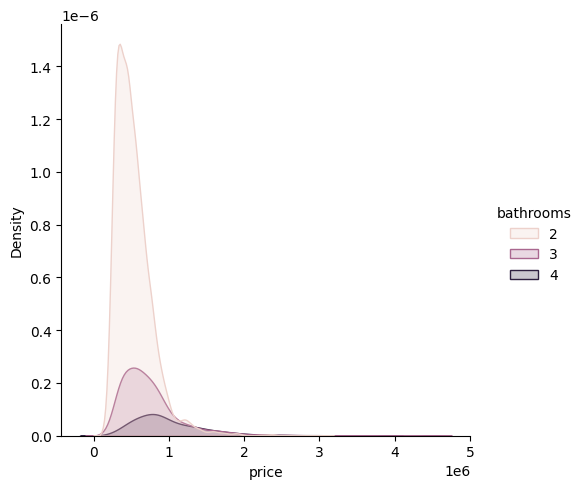

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

df = df.loc[(df['bathrooms'] >=2) & (df['bathrooms'] <=4)]
df['bathrooms']=df['bathrooms'].round().astype('int')
sns.displot(data=df, hue='bathrooms', x='price', kind='kde', fill= True)
plt.show()

In [ ]:
diebetes_url = 'https://raw.githubusercontent.com/iantonios/dsc205/refs/heads/main/diabetes_nan.csv'
